# R for data analysis
Date : May 28th 2020

## Example 1: Stock market 

Loading required package: xts

Loading required package: zoo


Attaching package: 'zoo'


The following objects are masked from 'package:base':

    as.Date, as.Date.numeric


Loading required package: TTR

Registered S3 method overwritten by 'quantmod':
  method            from
  as.zoo.data.frame zoo 

Version 0.4-0 included new data defaults. See ?getSymbols.



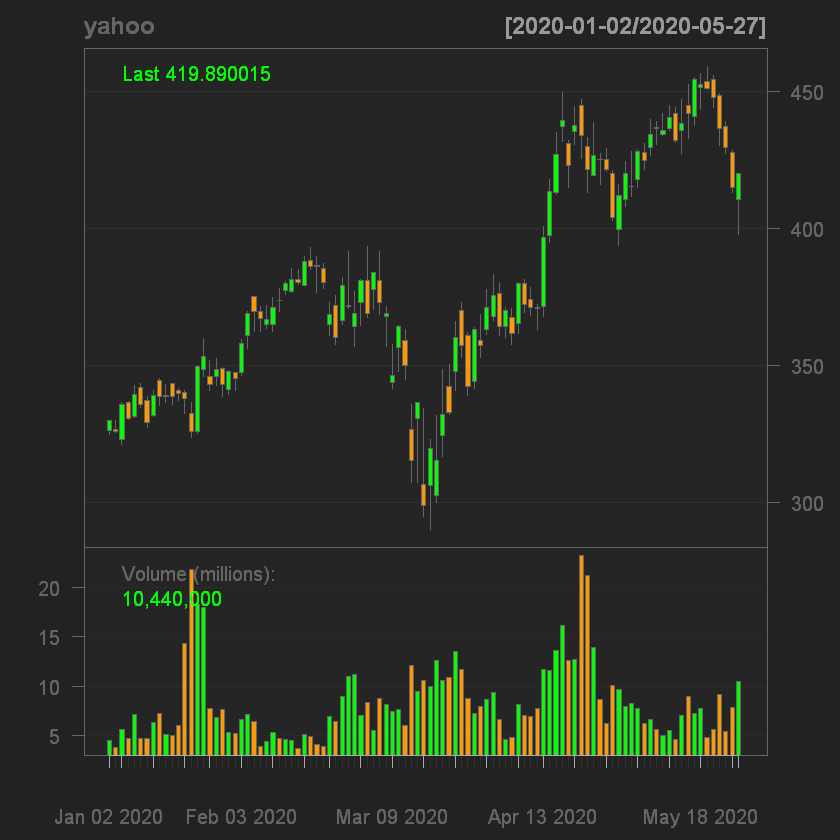

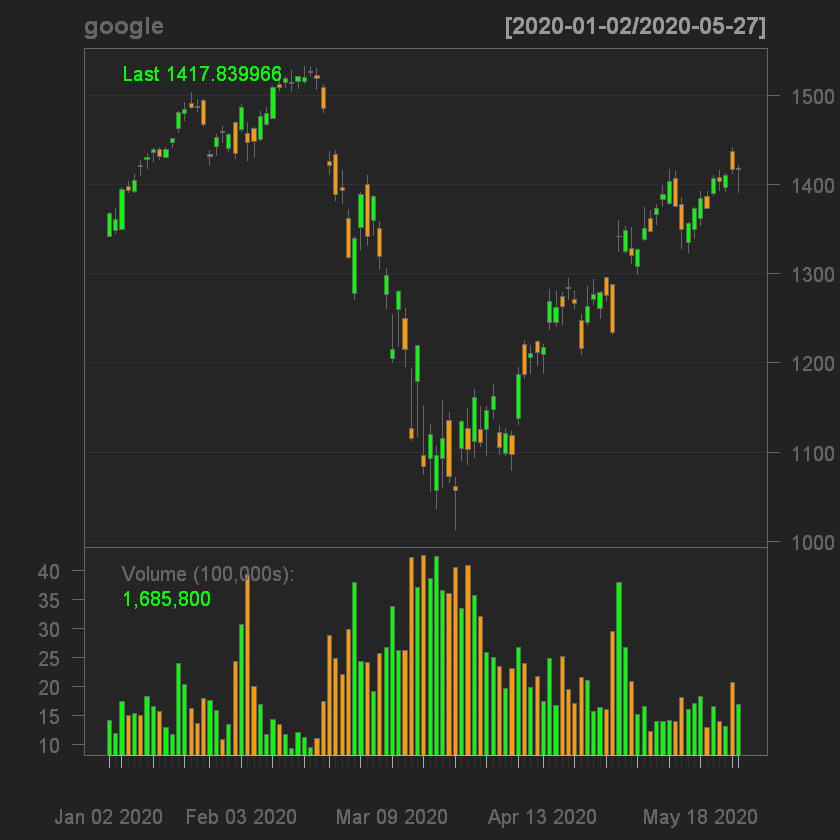

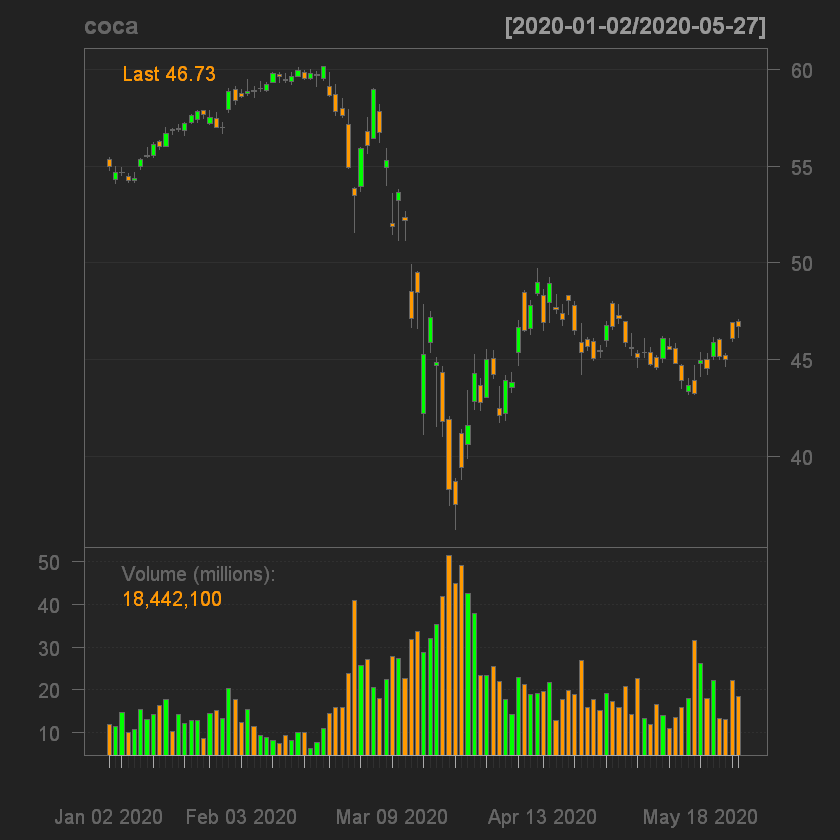

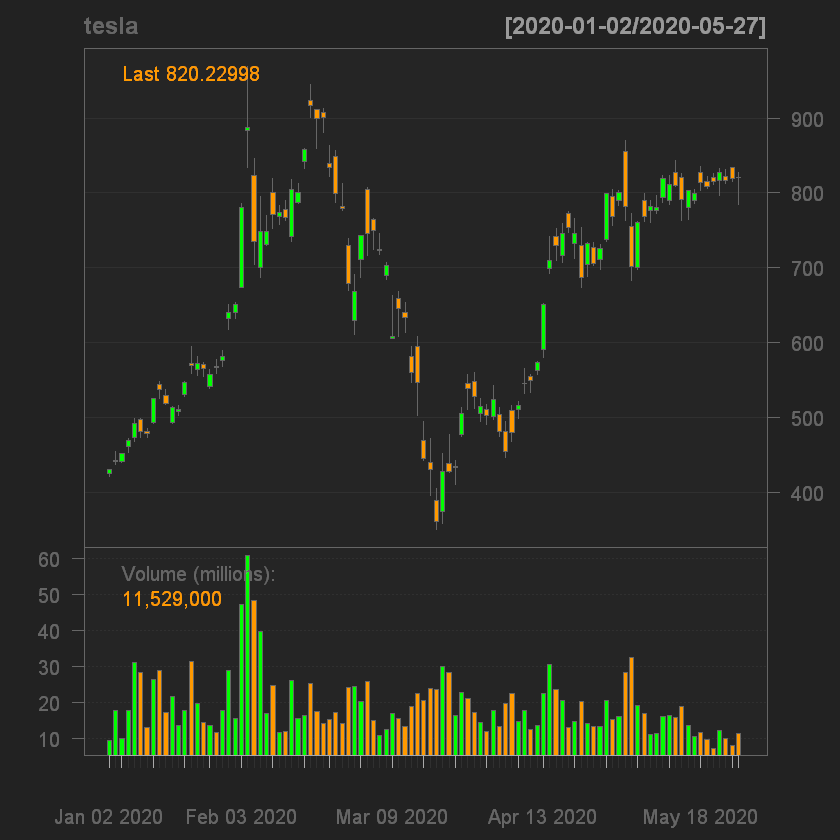

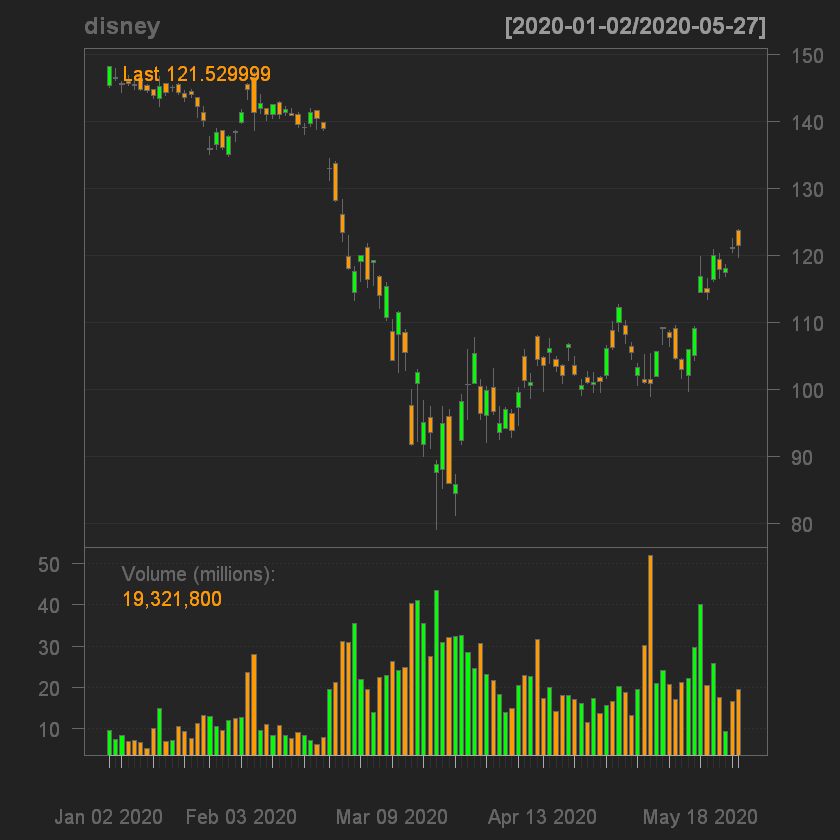

In [1]:
library("quantmod")
library("dygraphs")
options("getSymbols.warning4.0"=FALSE)

google <- getSymbols("GOOG", src = "yahoo", from = "2020-01-01", auto.assign = FALSE)
yahoo <- getSymbols("NFLX", src = "yahoo", from = "2020-01-01", auto.assign = FALSE)
coca <- getSymbols("KO", src = "yahoo", from = "2020-01-01", auto.assign = FALSE)
tesla <- getSymbols("TSLA", src = "yahoo", from = "2020-01-01", auto.assign = FALSE)
disney <- getSymbols("DIS", src = "yahoo", from = "2020-01-01", auto.assign = FALSE)




chartSeries(yahoo)
chartSeries(google)
chartSeries(coca)
chartSeries(tesla)
chartSeries(disney)

In [2]:
pacman::p_load(easyPubMed)

In [3]:
my_query <- 'covid-19 & vietnam'
my_entrez_id <- get_pubmed_ids(my_query)
my_abstracts_txt <- fetch_pubmed_data(my_entrez_id, format = "abstract")

In [4]:
length(my_entrez_id)

[1] 9

In [5]:
my_entrez_id

$Count
[1] "16447"

$RetMax
[1] "20"

$RetStart
[1] "0"

$QueryKey
[1] "1"

$WebEnv
[1] "NCID_1_20949641_130.14.22.33_9001_1590669029_342669843_0MetA0_S_MegaStore"

$IdList
$IdList$Id
[1] "32460448"

$IdList$Id
[1] "32460440"

$IdList$Id
[1] "32460433"

$IdList$Id
[1] "32460422"

$IdList$Id
[1] "32460421"

$IdList$Id
[1] "32460417"

$IdList$Id
[1] "32460415"

$IdList$Id
[1] "32460395"

$IdList$Id
[1] "32460391"

$IdList$Id
[1] "32460390"

$IdList$Id
[1] "32460385"

$IdList$Id
[1] "32460383"

$IdList$Id
[1] "32460378"

$IdList$Id
[1] "32460369"

$IdList$Id
[1] "32460364"

$IdList$Id
[1] "32460358"

$IdList$Id
[1] "32460357"

$IdList$Id
[1] "32460350"

$IdList$Id
[1] "32460349"

$IdList$Id
[1] "32460340"


$TranslationSet
$TranslationSet$From
[1] "covid-19"

$TranslationSet$To
[1] "\"COVID-19\"[All Fields] OR \"COVID-2019\"[All Fields] OR \"severe acute respiratory syndrome coronavirus 2\"[Supplementary Concept] OR \"severe acute respiratory syndrome coronavirus 2\"[All Fields] OR \"2019-nCoV\"[All Fields] OR \"SARS-CoV-2\"[All Fields] OR \"2019nCoV\"[All Fields] OR ((\"Wuhan\"[All Fields] AND (\"coronavirus\"[MeSH Terms] OR \"coronavirus\"[All Fields])) AND (2019/12[PDAT] OR 2020[PDAT]))"


$QueryTranslation
[1] "\"COVID-19\"[All Fields] OR \"COVID-2019\"[All Fields] OR \"severe acute respiratory syndrome coronavirus 2\"[Supplementary Concept] OR \"severe acute respiratory syndrome coronavirus 2\"[All Fields] OR \"2019-nCoV\"[All Fields] OR \"SARS-CoV-2\"[All Fields] OR \"2019nCoV\"[All Fields] OR ((\"Wuhan\"[All Fields] AND (\"coronavirus\"[MeSH Terms] OR \"coronavirus\"[All Fields])) AND (2019/12[PDAT] OR 2020[PDAT]))"

$OriginalQuery
[1] "covid-19+&+vietnam"

In [6]:
my_abstracts_xml <- fetch_pubmed_data(pubmed_id_list = my_entrez_id)

In [7]:
class(my_abstracts_xml) 

[1] "character"

In [8]:
#head(my_abstracts_xml,1)

In [9]:
my_titles <- custom_grep(my_abstracts_xml, "ArticleTitle", "char")
# use gsub to remove the tag, also trim long titles
TTM <- nchar(my_titles) > 75
my_titles[TTM] <- paste(substr(my_titles[TTM], 1, 70), "...", sep = "")

# Print as a data.frame (use kable)
head(my_titles)

[1] "Providing assisted reproduction treatment during the COVID-19 pandemic..."
[2] "Digital prosthetic workflow during COVID-19 pandemic to limit infectio..."
[3] "Well-Being and Education of Urology Residents During the COVID-19 Pand..."
[4] "Provision of obstetrics and gynaecology services during the COVID-19 p..."
[5] "Hypofractionated radiotherapy in patients with non-melanoma skin cance..."
[6] "COVID-19 - neurologists stay aware!"

In [25]:
new_query <- 'longitudinal models[TIAB] AND genetic selection[TIAB]' 
new_query <- get_pubmed_ids(new_query)
fetched_data <- fetch_pubmed_data(new_query, encoding = "ASCII")
new_PM_df <- table_articles_byAuth(pubmed_data = fetched_data, 
                                   included_authors = "first", 
                                   max_chars = 0, 
                                   encoding = "ASCII")

# Printing a sample of the resulting data frame
new_PM_df$address <- substr(new_PM_df$address, 1, 28)
new_PM_df$jabbrv <- substr(new_PM_df$jabbrv, 1, 9)
sid <- seq(5, nrow(new_PM_df), by = 10)

new_PM_df[sid, c("pmid", "year", "jabbrv", "lastname", "address")] 

Killing the request! Something is not working. Please, try again later

Processing PubMed data 


ERROR: Error in if (grepl("<PubmedArticle", TMP)) {: argument is of length zero


## Downloading and saving records as XML or TXT files

In [10]:
#out.A <- batch_pubmed_download(pubmed_query_string = my_query, 
#                               format = "xml", 
#                               batch_size = 20,
#                               dest_file_prefix = "easyPM_example",
#                               encoding = "ASCII")

In [11]:
# devtools::install_github("hrbrmstr/taucharts")
# devtools::install_github("hrbrmstr/metricsgraphics")
# https://rpubs.com/hrbrmstr/taucharts
#http://hrbrmstr.github.io/metricsgraphics/
library(taucharts)
library(htmltools)
library(htmlwidgets)
library(metricsgraphics)
library(RColorBrewer)

scatter_dat <- structure(list(team = c("d", "d", "d", "d", "l", "l", "l", "l", 
"k", "k", "k", "k"), cycleTime = c(1L, 2L, 3L, 4L, 2L, 3L, 4L, 
5L, 2L, 3L, 4L, 5L), effort = c(1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 
4L, 5L, 6L, 8L), count = c(1L, 5L, 8L, 3L, 1L, 5L, 8L, 3L, 1L, 
5L, 8L, 3L), priority = c("low", "low", "medium", "high", "low", 
"low", "medium", "high", "low", "low", "medium", "high")), .Names = c("team", 
"cycleTime", "effort", "count", "priority"), class = "data.frame", row.names = c(NA, 12L))

line_dat <- structure(list(type = c("us", "us", "us", "us", "us", "us", "bug", 
"bug", "bug", "bug", "bug"), count = c(0L, 10L, 15L, 12L, 16L, 
13L, 21L, 19L, 23L, 26L, 23L), date = c("12-2013", "01-2014", 
"02-2014", "03-2014", "04-2014", "05-2014", "01-2014", "02-2014", 
"03-2014", "04-2014", "05-2014")), .Names = c("type", "count", 
"date"), class = "data.frame", row.names = c(NA, 11L))

bar_dat <- structure(list(team = c("d", "d", "d", "d", "l", "l", "l", "l", 
"k", "k", "k", "k"), cycleTime = c(1L, 2L, 3L, 4L, 2L, 3L, 4L, 
5L, 2L, 3L, 4L, 5L), effort = c(1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 
4L, 5L, 6L, 8L), count = c(1L, 5L, 8L, 3L, 1L, 5L, 8L, 3L, 1L, 
5L, 8L, 3L), priority = c("low", "low", "medium", "high", "low", 
"low", "medium", "high", "low", "low", "medium", "high")), .Names = c("team", 
"cycleTime", "effort", "count", "priority"), class = "data.frame", row.names = c(NA, 12L))

car_dat <- structure(list(car = c("Toyota Prius+", "Volvo S60", "BMV X5", 
"Infinity FX", "Mercedes Vito", "Peugeot 3008", "Subaru Forester", 
"Lexus RX", "Bentley Continental"), co2 = c(96L, 135L, 197L, 
238L, 203L, 155L, 186L, 233L, 246L), hp = c(99L, 150L, 306L, 
238L, 95L, 120L, 150L, 188L, 507L), euroEco = c("eco", "eco", 
"non-eco", "non-eco", "non-eco", "non-eco", "non-eco", "non-eco", 
"non-eco"), power = c("low", "normal", "high", "high", "low", 
"low", "normal", "normal", "high")), .Names = c("car", "co2", 
"hp", "euroEco", "power"), class = "data.frame", row.names = c(NA, 9L))

splom_dat <- structure(list(param1 = c("hp", "hp", "hp", "co2", "co2", "co2", 
"mpg", "mpg", "mpg", "hp", "hp", "hp", "co2", "co2", "co2", "mpg", 
"mpg", "mpg", "hp", "hp", "hp", "co2", "co2", "co2", "mpg", "mpg", 
"mpg", "hp", "hp", "hp", "co2", "co2", "co2", "mpg", "mpg", "mpg", 
"hp", "hp", "hp", "co2", "co2", "co2", "mpg", "mpg", "mpg", "hp", 
"hp", "hp", "co2", "co2", "co2", "mpg", "mpg", "mpg", "hp", "hp", 
"hp", "co2", "co2", "co2", "mpg", "mpg", "mpg", "hp", "hp", "hp", 
"co2", "co2", "co2", "mpg", "mpg", "mpg", "hp", "hp", "hp", "co2", 
"co2", "co2", "mpg", "mpg", "mpg"), param2 = c("hp", "co2", "mpg", 
"hp", "co2", "mpg", "hp", "co2", "mpg", "hp", "co2", "mpg", "hp", 
"co2", "mpg", "hp", "co2", "mpg", "hp", "co2", "mpg", "hp", "co2", 
"mpg", "hp", "co2", "mpg", "hp", "co2", "mpg", "hp", "co2", "mpg", 
"hp", "co2", "mpg", "hp", "co2", "mpg", "hp", "co2", "mpg", "hp", 
"co2", "mpg", "hp", "co2", "mpg", "hp", "co2", "mpg", "hp", "co2", 
"mpg", "hp", "co2", "mpg", "hp", "co2", "mpg", "hp", "co2", "mpg", 
"hp", "co2", "mpg", "hp", "co2", "mpg", "hp", "co2", "mpg", "hp", 
"co2", "mpg", "hp", "co2", "mpg", "hp", "co2", "mpg"), value1 = c(99, 
99, 99, 96, 96, 96, 3.8, 3.8, 3.8, 150, 150, 150, 135, 135, 135, 
7.4, 7.4, 7.4, 306, 306, 306, 197, 197, 197, 11.2, 11.2, 11.2, 
238, 238, 238, 238, 238, 238, 11.2, 11.2, 11.2, 95, 95, 95, 203, 
203, 203, 9.4, 9.4, 9.4, 120, 120, 120, 155, 155, 155, 9.2, 9.2, 
9.2, 150, 150, 150, 186, 186, 186, 10.4, 10.4, 10.4, 188, 188, 
188, 233, 233, 233, 13.3, 13.3, 13.3, 507, 507, 507, 246, 246, 
246, 15.4, 15.4, 15.4), value2 = c(99, 96, 3.8, 99, 96, 3.8, 
99, 96, 3.8, 150, 135, 7.4, 150, 135, 7.4, 150, 135, 7.4, 306, 
197, 11.2, 306, 197, 11.2, 306, 197, 11.2, 238, 238, 11.2, 238, 
238, 11.2, 238, 238, 11.2, 95, 203, 9.4, 95, 203, 9.4, 95, 203, 
9.4, 120, 155, 9.2, 120, 155, 9.2, 120, 155, 9.2, 150, 186, 10.4, 
150, 186, 10.4, 150, 186, 10.4, 188, 233, 13.3, 188, 233, 13.3, 
188, 233, 13.3, 507, 246, 15.4, 507, 246, 15.4, 507, 246, 15.4
)), .Names = c("param1", "param2", "value1", "value2"), class = "data.frame", row.names = c(NA, 
81L))

In [12]:
tc <- tauchart(car_dat) %>%
  tau_point( "hp", c("euroEco","co2"), color = "euroEco" ) %>%
  tau_legend( ) %>%
  tau_tooltip( )

tc %>%
  tau_trendline( )  #using defaults

HTML widgets cannot be represented in plain text (need html)

In [13]:
car_dat

,car,co2,hp,euroEco,power
,<chr>,<int>,<int>,<chr>,<chr>
1,Toyota Prius+,96,99,eco,low
2,Volvo S60,135,150,eco,normal
3,BMV X5,197,306,non-eco,high
4,Infinity FX,238,238,non-eco,high
5,Mercedes Vito,203,95,non-eco,low
6,Peugeot 3008,155,120,non-eco,low
7,Subaru Forester,186,150,non-eco,normal
8,Lexus RX,233,188,non-eco,normal
9,Bentley Continental,246,507,non-eco,high


In [14]:
data(cars_data)
tauchart(cars_data) %>% 
  tau_point("milespergallon", c("class", "price"), color="class") %>% 
  tau_legend() %>% 
  tau_trendline() %>% 
  tau_tooltip(c("vehicle", "year", "class", "price", "milespergallon"))

HTML widgets cannot be represented in plain text (need html)

In [15]:
#devtools::install_github("hrbrmstr/metricsgraphics") run in R console


library(htmltools)
library(htmlwidgets)
library(metricsgraphics)
library(RColorBrewer)
tmp <- data.frame(year=seq(1790, 1970, 10), uspop=as.numeric(uspop))

tmp %>%
  mjs_plot(x=year, y=uspop) %>%
  mjs_line() %>%
  mjs_add_marker(1850, "Something Wonderful") %>%
  mjs_add_baseline(150, "Something Awful")

HTML widgets cannot be represented in plain text (need html)

In [16]:
mtcars %>%
  mjs_plot(x=wt, y=mpg, width=600, height=500) %>%
  mjs_point(color_accessor=carb, size_accessor=carb) %>%
  mjs_labs(x="Weight of Car", y="Miles per Gallon")

HTML widgets cannot be represented in plain text (need html)

In [17]:
tmp %>%
  mjs_plot(x=uspop, y=year, width=500, height=400) %>%
  mjs_bar() %>%
  mjs_axis_x(xax_format = 'plain')

HTML widgets cannot be represented in plain text (need html)

In [18]:
mtcars %>%
  mjs_plot(x=wt, y=mpg, width=600, height=500) %>%
  mjs_point(color_accessor=cyl,
            x_rug=TRUE, y_rug=TRUE,
            size_accessor=carb,
            size_range=c(5, 10),
            color_type="category",
            color_range=brewer.pal(n=11, name="RdBu")[c(1, 5, 11)]) %>%
  mjs_labs(x="Weight of Car", y="Miles per Gallon") %>%
  mjs_add_legend(legend="X")

HTML widgets cannot be represented in plain text (need html)

In [19]:
mtcars %>%
  mjs_plot(x=wt, y=mpg, width=600, height=500) %>%
  mjs_point(least_squares=TRUE) %>%
  mjs_labs(x="Weight of Car", y="Miles per Gallon")

HTML widgets cannot be represented in plain text (need html)

In [20]:
library(coronavirus)

In [21]:
#pacman::p_load(coronavirus)
data("coronavirus")

In [22]:
coronavirus %>% head()

,date,province,country,lat,long,type,cases
,<date>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<int>
1,2020-01-22,,Afghanistan,33,65,confirmed,0
2,2020-01-23,,Afghanistan,33,65,confirmed,0
3,2020-01-24,,Afghanistan,33,65,confirmed,0
4,2020-01-25,,Afghanistan,33,65,confirmed,0
5,2020-01-26,,Afghanistan,33,65,confirmed,0
6,2020-01-27,,Afghanistan,33,65,confirmed,0


In [23]:
coronavirus %>%
  mjs_plot(x=lat, y=long, width=600, height=500) %>%
  mjs_point(least_squares=TRUE) %>%
  mjs_labs(x="Weight of Car", y="Miles per Gallon")

HTML widgets cannot be represented in plain text (need html)

In [ ]:
set.seed(1492)
stocks <- data.frame(
  time = as.Date('2009-01-01') + 0:9,
  X = rnorm(10, 0, 1),
  Y = rnorm(10, 0, 2),
  Z = rnorm(10, 0, 4))

stocks %>%
  mjs_plot(x=time, y=X) %>%
  mjs_line() %>%
  mjs_add_line(Y) %>%
  mjs_add_line(Z) %>%
  mjs_axis_x(xax_format="date") %>%
  mjs_add_legend(legend=c("X", "Y", "Z"))